<a href="https://colab.research.google.com/github/mostafadentist/python-ipynb/blob/main/yolo_12.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q git+https://github.com/sunsmarterjie/yolov12.git roboflow supervision flash-attn

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 83.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.1/83.1 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 41.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 102.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import os
from google.colab import userdata

os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

In [ ]:
!nvidia-smi

Thu Feb 20 12:22:27 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   31C    P0             49W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


100%|██████████| 114M/114M [00:00<00:00, 259MB/s]


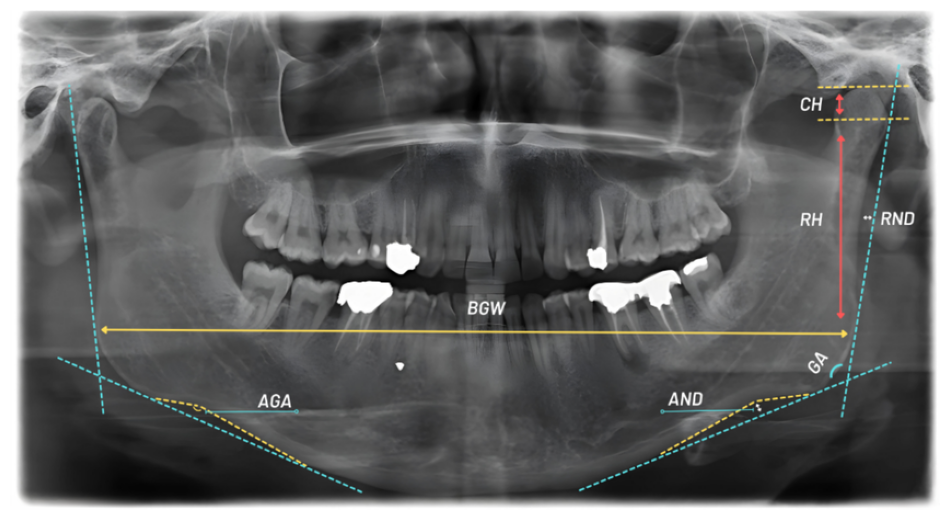

In [ ]:
import cv2
from ultralytics import YOLO
import supervision as sv


image_path = f"{HOME}/Dental-panoramic-radiograph-and-a-diagrammatic-representation-of-measurements-of-the.png"
image = cv2.imread(image_path)

model = YOLO('yolov12x.pt')

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results)

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

In [ ]:
from roboflow import download_dataset

dataset = download_dataset('https://universe.roboflow.com/implant-system-identification/implant-system-detection/dataset/4', 'yolov8')

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to IMPLANT-SYSTEM-DETECTION-4 in yolov8:: 100%|██████████| 25570/25570 [00:03<00:00, 7436.14it/s] 


In [ ]:
!ls {dataset.location}

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [ ]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

In [ ]:
!cat {dataset.location}/data.yaml

names:
- ADIN
- DIONAVI
- Dentium
- MIS
- NORIS
- nobel
- osstem
nc: 7
roboflow:
  license: CC BY 4.0
  project: implant-system-detection
  url: https://universe.roboflow.com/implant-system-identification/implant-system-detection/dataset/4
  version: 4
test: ../test/images
train: ../train/images
val: ../valid/images


In [ ]:
from ultralytics import YOLO

model = YOLO('yolov12x.pt')  # changed from 's' to 'x' for extra large model

results = model.train(
    data=f'{dataset.location}/data.yaml',
    epochs=100,
    patience=15  # Early stopping patience of 15 epochs
)

New https://pypi.org/project/ultralytics/8.3.77 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: task=detect, mode=train, model=yolov12x.pt, data=/content/IMPLANT-SYSTEM-DETECTION-4/data.yaml, epochs=100, time=None, patience=15, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, emb

100%|██████████| 755k/755k [00:00<00:00, 98.9MB/s]


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1      2784  ultralytics.nn.modules.conv.Conv             [3, 96, 3, 2]                 
  1                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  2                  -1  2    389760  ultralytics.nn.modules.block.C3k2            [192, 384, 2, True, 0.25]     
  3                  -1  1   1327872  ultralytics.nn.modules.conv.Conv             [384, 384, 3, 2]              
  4                  -1  2   1553664  ultralytics.nn.modules.block.C3k2            [384, 768, 2, True, 0.25]     
  5                  -1  1   5309952  ultralytics.nn.modules.conv.Conv             [768, 768, 3, 2]              
  6                  -1  4   9515200  ultralytics.nn.modules.block.A2C2f           [768, 768, 4, True, 4, True, 1.2]
  7                  -1  1   5309952  ultralyt

100%|██████████| 5.34M/5.34M [00:00<00:00, 263MB/s]


AMP: checks passed ✅


train: Scanning /content/IMPLANT-SYSTEM-DETECTION-4/train/labels... 12541 images, 53 backgrounds, 0 corrupt: 100%|██████████| 12541/12541 [00:08<00:00, 1472.01it/s]


train: New cache created: /content/IMPLANT-SYSTEM-DETECTION-4/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 297, len(boxes) = 21808. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression
val: Scanning /content/IMPLANT-SYSTEM-DETECTION-4/valid/labels... 155 images, 1 backgrounds, 0 corrupt: 100%|██████████| 155/155 [00:00<00:00, 1265.04it/s]

val: New cache created: /content/IMPLANT-SYSTEM-DETECTION-4/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 6, len(boxes) = 292. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 205 weight(decay=0.0), 214 weight(decay=0.0005), 227 bias(decay=0.0)
TensorBoard: WARNING ⚠️ TensorBoard graph visualization failure Tracing failed sanity checks!
ERROR: Graphs differed across invocations!
	Graph diff:
		  graph(%self.1 : __torch__.ultralytics.nn.tasks.DetectionModel,
		        %x.1 : Tensor):
		    %model : __torch__.torch.nn.modules.container.Sequential = prim::GetAttr[name="model"](%self.1)
		    %_21 : __torch__.ultralytics.nn.modules.head.Detect = prim::GetAttr[name="21"](%model)
		    %model.43 : __torch__.torch.nn.modules.container.Sequential = prim::GetAttr[name="model"](%self.1)
		    %_20 : __torch__.ultralytics.nn.modules.block.C3k2 = prim::GetAttr[name="20"](%model.43)
		    %model.41 : __torch__.torc

      1/100      18.7G      1.257       1.71      1.335         52        640: 100%|██████████| 784/784 [04:12<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.35it/s]

                   all        155        292      0.573      0.578      0.598      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      18.2G      1.241       1.19      1.294         44        640: 100%|██████████| 784/784 [03:58<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.71it/s]

                   all        155        292      0.601      0.531      0.509      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      18.4G      1.329      1.329      1.368         35        640: 100%|██████████| 784/784 [03:52<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.90it/s]

                   all        155        292      0.598      0.527      0.515      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      18.4G      1.322      1.301      1.383         40        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.91it/s]

                   all        155        292      0.602      0.545      0.576      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      18.4G       1.27      1.145       1.35         24        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.73it/s]

                   all        155        292       0.56      0.544      0.583      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      18.4G      1.217      1.066      1.309         34        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.93it/s]

                   all        155        292      0.696      0.581      0.632      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      18.4G      1.168      0.963      1.277         33        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.93it/s]

                   all        155        292      0.815      0.621      0.728      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      18.4G      1.133     0.8962      1.255         47        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.90it/s]

                   all        155        292      0.769      0.624       0.75      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      18.4G      1.108     0.8561      1.236         29        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.82it/s]

                   all        155        292      0.664        0.7      0.736      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      18.4G      1.085     0.8167      1.222         29        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.90it/s]

                   all        155        292      0.747       0.67      0.736      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      18.4G      1.067     0.7752      1.208         31        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.90it/s]

                   all        155        292      0.639      0.722      0.734      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      18.4G      1.033     0.7366      1.191         23        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.91it/s]

                   all        155        292      0.714      0.661      0.688      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      18.4G      1.015     0.7172       1.18         49        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.95it/s]

                   all        155        292       0.73      0.674       0.75      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      18.4G     0.9969     0.6746      1.162         40        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.87it/s]

                   all        155        292      0.684       0.66      0.697      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      18.4G     0.9721     0.6628      1.152         37        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.91it/s]

                   all        155        292      0.657      0.698      0.659      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      18.4G     0.9524      0.632      1.139         34        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.85it/s]

                   all        155        292      0.798      0.717      0.766      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      18.4G     0.9371     0.6213      1.128         43        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.89it/s]

                   all        155        292      0.706      0.674      0.737      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      18.4G     0.9174     0.5965      1.116         44        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.86it/s]

                   all        155        292      0.812      0.709      0.784      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      18.4G     0.8986     0.5839      1.112         30        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.86it/s]

                   all        155        292      0.824      0.689      0.804      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      18.4G     0.8868     0.5649      1.101         28        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.91it/s]

                   all        155        292      0.825      0.698        0.8      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      18.4G     0.8617     0.5523      1.094         19        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.84it/s]

                   all        155        292      0.699      0.723      0.765      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      18.4G     0.8514     0.5471      1.081         70        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.96it/s]

                   all        155        292      0.802      0.686      0.768      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      18.4G     0.8347     0.5184       1.07         42        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.92it/s]

                   all        155        292        0.8      0.708      0.794      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      18.4G     0.8217      0.513      1.064         31        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.84it/s]

                   all        155        292      0.787      0.727       0.79      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      18.4G     0.8018     0.5021       1.06         33        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.88it/s]

                   all        155        292      0.785      0.707      0.797      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      18.4G     0.7958     0.4911      1.049         33        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.91it/s]

                   all        155        292      0.718      0.748      0.781       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      18.4G     0.7838     0.4889      1.048         33        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.93it/s]

                   all        155        292      0.752        0.7      0.775      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      18.4G     0.7683     0.4712      1.039         47        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.91it/s]

                   all        155        292      0.763      0.684      0.767      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      18.4G     0.7597     0.4624      1.033         35        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.89it/s]

                   all        155        292      0.809      0.694       0.76      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      18.4G     0.7419     0.4476      1.023         35        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.96it/s]

                   all        155        292      0.765      0.681      0.779      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      18.4G     0.7333     0.4475      1.022         63        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.92it/s]

                   all        155        292      0.787      0.703      0.785       0.57
                   all        155        292      0.787      0.703      0.785       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      18.4G     0.7274     0.4409      1.015         28        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.91it/s]

                   all        155        292      0.742       0.72      0.784      0.578
                   all        155        292      0.742       0.72      0.784      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      18.4G     0.7149     0.4378      1.012         29        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.97it/s]

                   all        155        292       0.76      0.705      0.791      0.582
                   all        155        292       0.76      0.705      0.791      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      18.4G     0.7089     0.4295      1.003         33        640: 100%|██████████| 784/784 [03:50<00:00,  3.40it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.81it/s]

                   all        155        292      0.778      0.701      0.796      0.579
                   all        155        292      0.778      0.701      0.796      0.579
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 19, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 19, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



34 epochs completed in 2.218 hours.

34 epochs completed in 2.218 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 119.1MB
Optimizer stripped from runs/detect/train/weights/last.pt, 119.1MB
Optimizer stripped from runs/detect/train/weights/best.pt, 119.1MB
Optimizer stripped from runs/detect/train/weights/best.pt, 119.1MB

Validating runs/detect/train/weights/best.pt...

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv12x summary (fused): 626 layers, 59,051,429 parameters, 0 gradients, 198.6 GFLOPs
YOLOv12x summary (fused): 626 layers, 59,051,429 parameters, 0 gradients, 198.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.81it/s]



                   all        155        292      0.824      0.689      0.804      0.602
                   all        155        292      0.824      0.689      0.804      0.602
                  ADIN         38         70      0.957      0.636      0.777       0.55
                  ADIN         38         70      0.957      0.636      0.777       0.55
               Dentium         15         19      0.887      0.684      0.742      0.612
               Dentium         15         19      0.887      0.684      0.742      0.612
                   MIS          7         21      0.558       0.81      0.848      0.664
                   MIS          7         21      0.558       0.81      0.848      0.664
                 NORIS         33         42      0.819      0.537      0.743      0.615
                 NORIS         33         42      0.819      0.537      0.743      0.615
                osstem         61        140      0.901      0.779      0.908      0.567
                osste

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!ls {HOME}/runs/detect/train/

args.yaml					    PR_curve.png	   val_batch0_pred.jpg
confusion_matrix_normalized.png			    R_curve.png		   val_batch1_labels.jpg
confusion_matrix.png				    results.csv		   val_batch1_pred.jpg
events.out.tfevents.1740054218.c1b7e2b8d6bc.1182.0  results.png		   val_batch2_labels.jpg
F1_curve.png					    train_batch0.jpg	   val_batch2_pred.jpg
labels_correlogram.jpg				    train_batch1.jpg	   weights
labels.jpg					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg


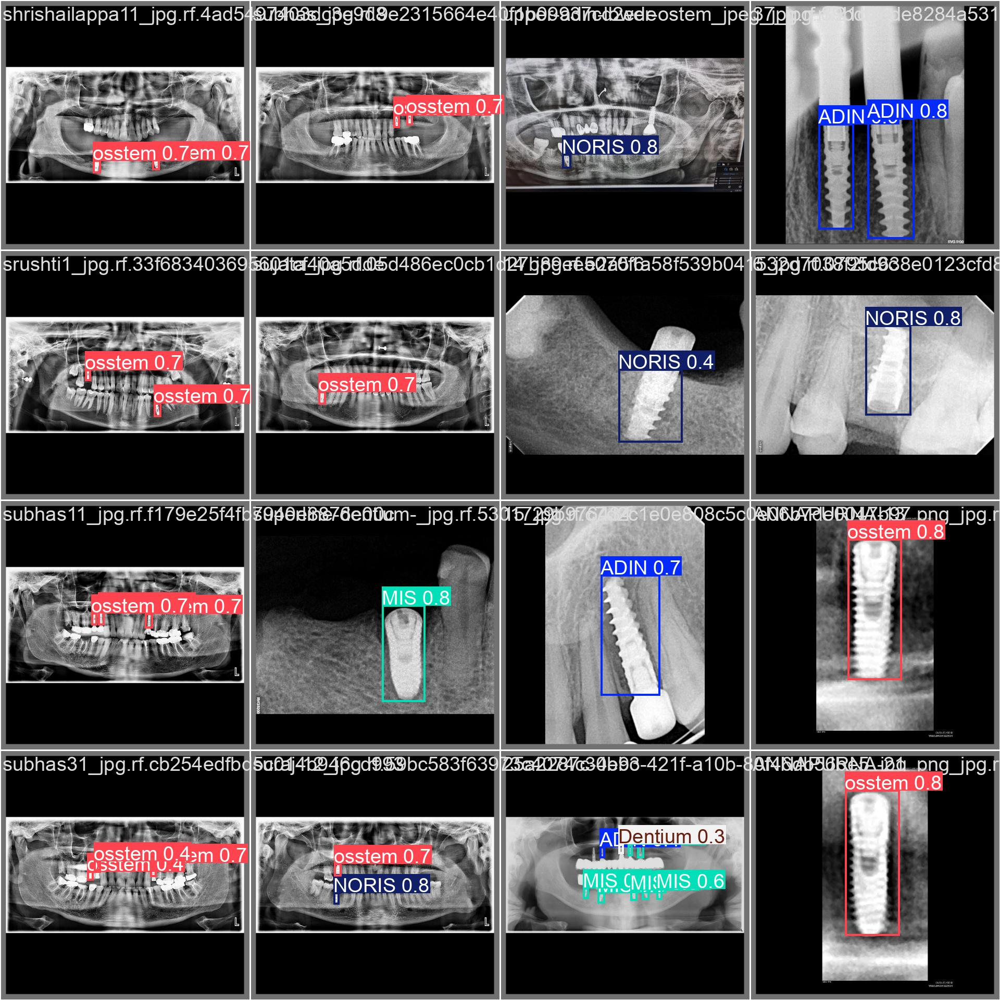

In [ ]:
#val_batch0_pred.jpg
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=1000)

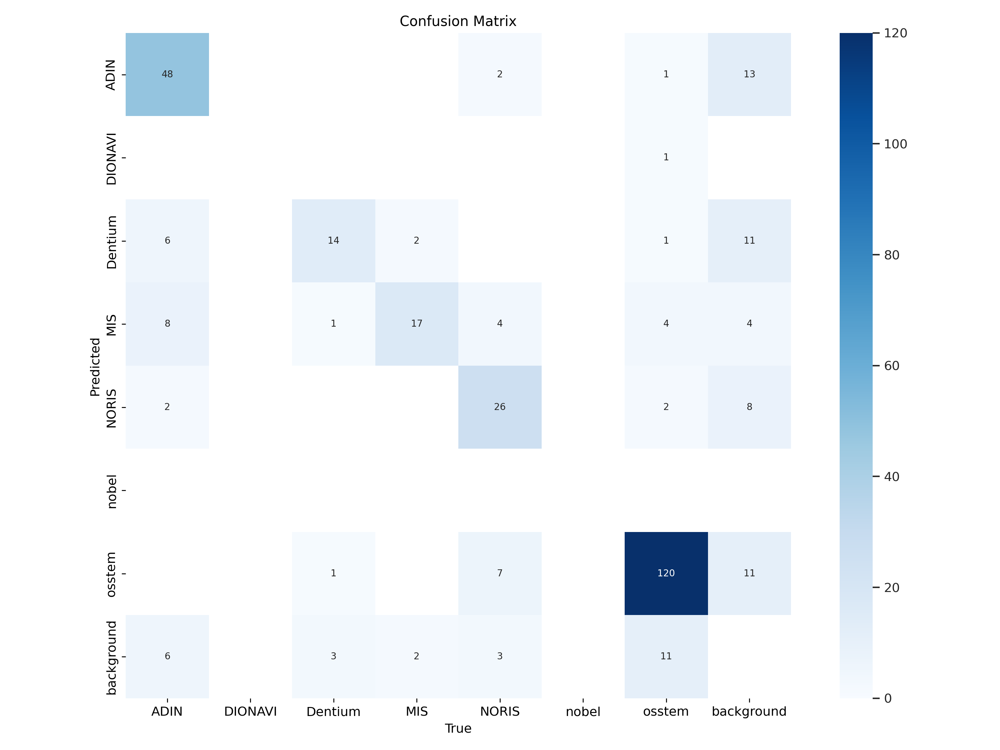

In [ ]:
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=1000)

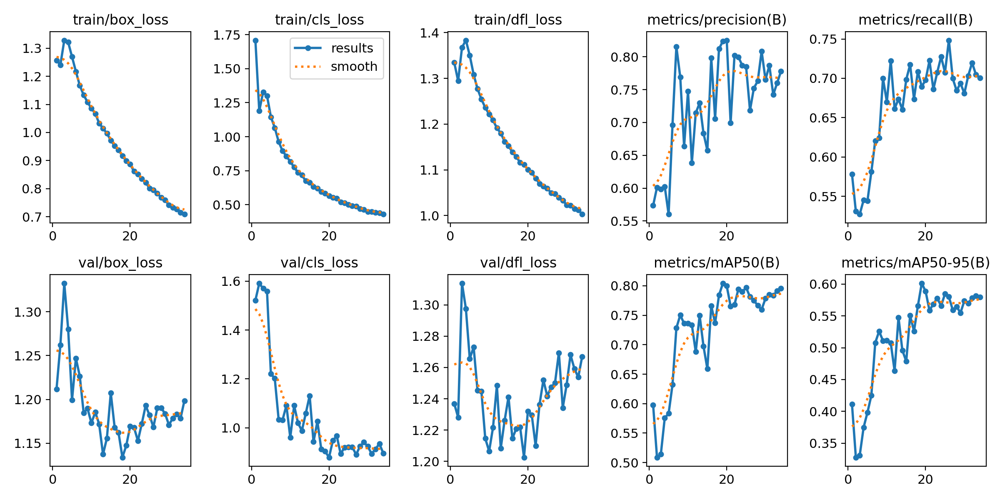

In [ ]:
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/results.png', width=1000)

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml"
)

ds.classes

['ADIN', 'DIONAVI', 'Dentium', 'MIS', 'NORIS', 'nobel', 'osstem']

In [ ]:
from supervision.metrics import MeanAveragePrecision

model = YOLO(f'/{HOME}/runs/detect/train/weights/best.pt')

predictions = []
targets = []

for _, image, target in ds:
    results = model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)

    predictions.append(detections)
    targets.append(target)

map = MeanAveragePrecision().update(predictions, targets).compute()

In [ ]:
print("mAP 50:95", map.map50_95)
print("mAP 50", map.map50)
print("mAP 75", map.map75)

mAP 50:95 0.38407763469190825
mAP 50 0.5236658451806963
mAP 75 0.4436338767089062


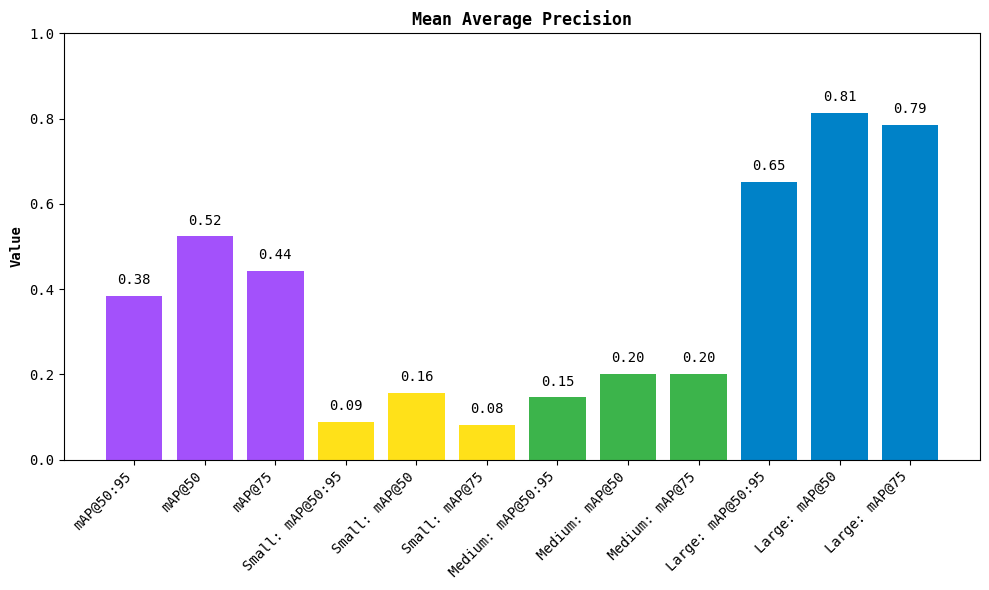

In [ ]:
map.plot()

In [ ]:
import supervision as sv

model = YOLO(f'/{HOME}/runs/detect/train/weights/best.pt')

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml"
)

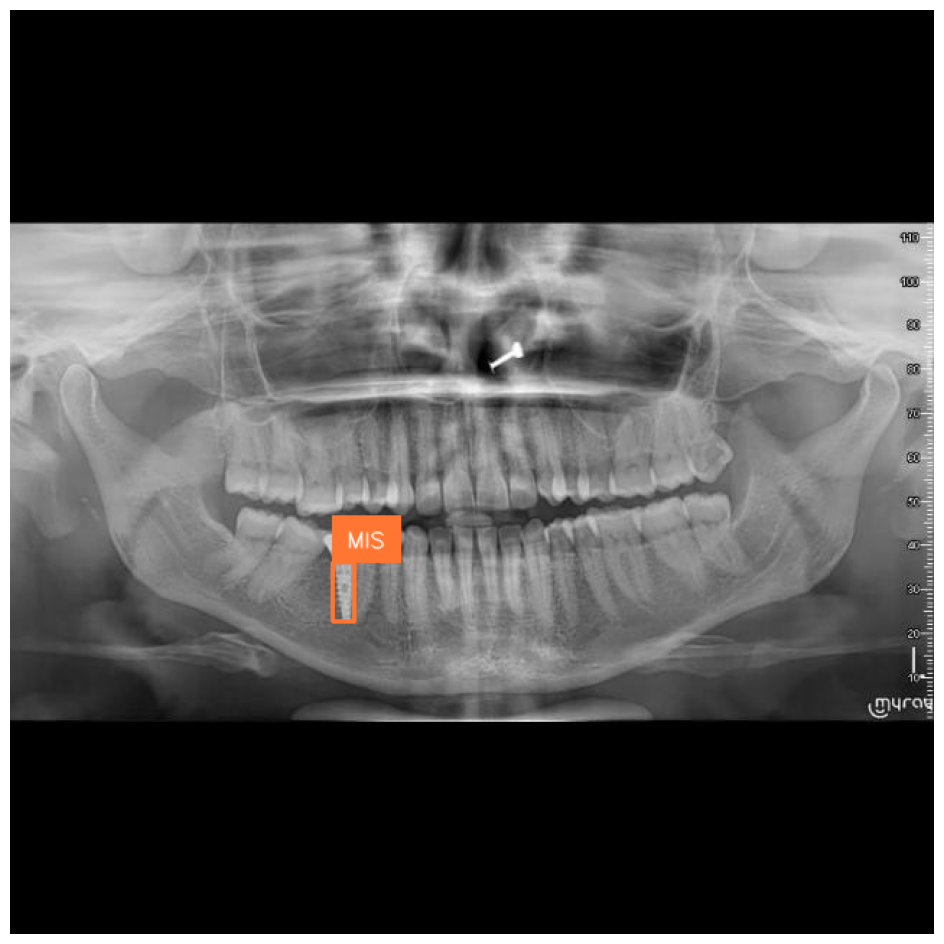

In [ ]:
import random

i = random.randint(0, len(ds))

image_path, image, target = ds[i]

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results).with_nms()

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

In [ ]:
def calculate_iou(box1, box2):
    # Convert boxes to [x1, y1, x2, y2] format
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection

    return intersection / union if union > 0 else 0

# Calculate IoU for each prediction-target pair
ious = []
for pred, target in zip(predictions, targets):
    pred_boxes = pred.xyxy  # Predicted bounding boxes
    target_boxes = target.xyxy  # Ground truth boxes

    for pred_box in pred_boxes:
        max_iou = 0
        for target_box in target_boxes:
            iou = calculate_iou(pred_box, target_box)
            max_iou = max(max_iou, iou)
        ious.append(max_iou)

# Calculate average IoU
avg_iou = sum(ious) / len(ious) if ious else 0
print(f"Average IoU: {avg_iou:.3f}")

Average IoU: 0.761


In [ ]:
for _, image, target in ds:
    results = model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)
    predictions.append(detections)
    targets.append(target)

In [ ]:
def detailed_check(model_path):
    model = YOLO(model_path)

    # Try to get model info
    try:
        # This will show what base model was used for training
        print("Base model info:")
        print(model.info())
        print("\nModel type:", type(model.model))
        print("\nTraining configuration (if available):")
        print(model.model.yaml if hasattr(model.model, 'yaml') else "No yaml config found")
    except Exception as e:
        print(f"Error getting details: {e}")

model_path = '/content/runs/detect/train/weights/best.pt'
detailed_check(model_path)

Base model info:
YOLOv12x summary: 831 layers, 59,132,613 parameters, 0 gradients, 199.9 GFLOPs
(831, 59132613, 0, 199.8566912)

Model type: <class 'ultralytics.nn.tasks.DetectionModel'>

Training configuration (if available):
{'nc': 7, 'scales': {'n': [0.5, 0.25, 1024], 's': [0.5, 0.5, 1024], 'm': [0.5, 1.0, 512], 'l': [1.0, 1.0, 512], 'x': [1.0, 1.5, 512]}, 'backbone': [[-1, 1, 'Conv', [64, 3, 2]], [-1, 1, 'Conv', [128, 3, 2]], [-1, 2, 'C3k2', [256, False, 0.25]], [-1, 1, 'Conv', [256, 3, 2]], [-1, 2, 'C3k2', [512, False, 0.25]], [-1, 1, 'Conv', [512, 3, 2]], [-1, 4, 'A2C2f', [512, True, 4]], [-1, 1, 'Conv', [1024, 3, 2]], [-1, 4, 'A2C2f', [1024, True, 1]]], 'head': [[-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 6], 1, 'Concat', [1]], [-1, 2, 'A2C2f', [512, False, -1]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 4], 1, 'Concat', [1]], [-1, 2, 'A2C2f', [256, False, -1]], [-1, 1, 'Conv', [256, 3, 2]], [[-1, 11], 1, 'Concat', [1]], [-1, 2, 'A2C2f', [512, False, -1]], 

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov12x.pt')
# Print model structure
for name, module in model.model.named_modules():
    if any(attention_type in name.lower() for attention_type in ['attn', 'attention']):
        print(f"\nAttention Layer: {name}")
        print(f"Structure: {module}")


Attention Layer: model.6.m.0.0.attn
Structure: AAttn(
  (qkv): Conv(
    (conv): Conv2d(384, 1152, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(1152, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
    (act): Identity()
  )
  (proj): Conv(
    (conv): Conv2d(384, 384, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(384, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
    (act): Identity()
  )
  (pe): Conv(
    (conv): Conv2d(384, 384, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=384)
    (bn): BatchNorm2d(384, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
    (act): Identity()
  )
)

Attention Layer: model.6.m.0.0.attn.qkv
Structure: Conv(
  (conv): Conv2d(384, 1152, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(1152, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
  (act): Identity()
)

Attention Layer: model.6.m.0.0.attn.qkv.conv
Struct

In [ ]:
import shutil
import os

# Create yolo_12 directory in Drive if it doesn't exist
drive_path = '/content/drive/MyDrive/yolo_12'
os.makedirs(drive_path, exist_ok=True)

# Copy the entire runs folder to drive
source_path = '/content/runs'
destination_path = os.path.join(drive_path, 'runs')

try:
    shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
    print(f"Successfully copied runs folder to {destination_path}")
except Exception as e:
    print(f"An error occurred: {str(e)}")

# Verify the copy
if os.path.exists(destination_path):
    print("Verification: Files successfully saved to Drive")
    # Optional: List contents
    print("\nContents of saved directory:")
    for root, dirs, files in os.walk(destination_path):
        print(f"\nDirectory: {root}")
        if files:
            print("Files:", files)

Successfully copied runs folder to /content/drive/MyDrive/yolo_12/runs
Verification: Files successfully saved to Drive

Contents of saved directory:

Directory: /content/drive/MyDrive/yolo_12/runs

Directory: /content/drive/MyDrive/yolo_12/runs/detect

Directory: /content/drive/MyDrive/yolo_12/runs/detect/train
Files: ['F1_curve.png', 'val_batch1_labels.jpg', 'confusion_matrix.png', 'train_batch2.jpg', 'events.out.tfevents.1740054218.c1b7e2b8d6bc.1182.0', 'val_batch0_labels.jpg', 'args.yaml', 'PR_curve.png', 'results.png', 'R_curve.png', 'val_batch1_pred.jpg', 'results.csv', 'train_batch1.jpg', 'labels.jpg', 'confusion_matrix_normalized.png', 'val_batch2_pred.jpg', 'labels_correlogram.jpg', 'val_batch0_pred.jpg', 'P_curve.png', 'train_batch0.jpg', 'val_batch2_labels.jpg']

Directory: /content/drive/MyDrive/yolo_12/runs/detect/train/weights
Files: ['best.pt', 'last.pt']


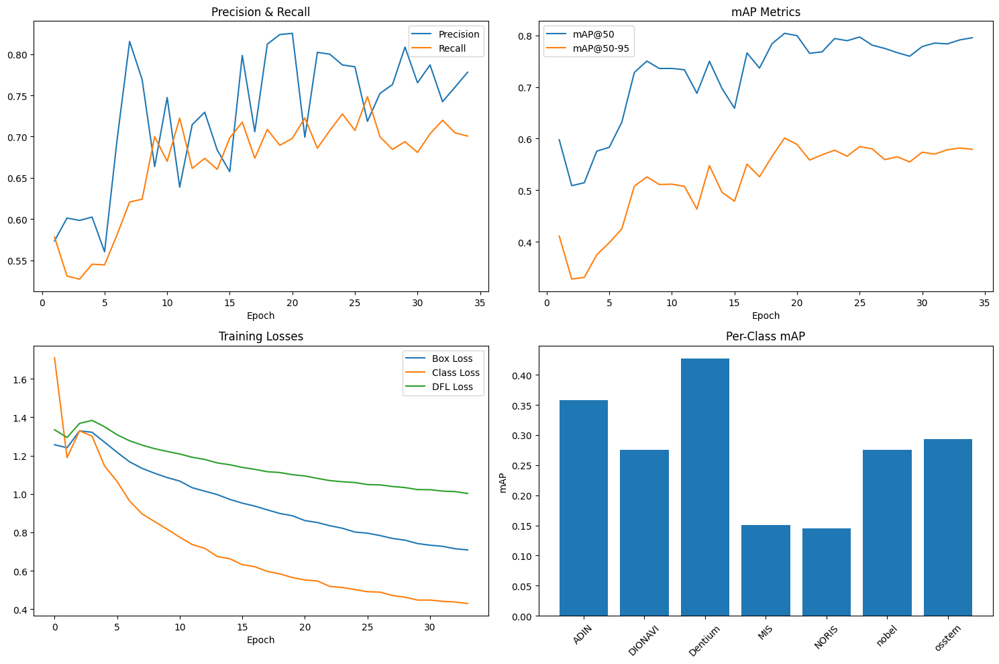


Final Training Results:
----------------------------------------
Precision: 0.7780
Recall: 0.7006
mAP@50: 0.7956
mAP@50-95: 0.5793

Per-class Performance:
----------------------------------------
ADIN      : 0.3583 mAP
DIONAVI   : 0.2751 mAP
Dentium   : 0.4272 mAP
MIS       : 0.1511 mAP
NORIS     : 0.1456 mAP
nobel     : 0.2751 mAP
osstem    : 0.2933 mAP


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
# Load training results (metrics) from the CSV file for visualization.
results_df = pd.read_csv('/content/runs/detect/train/results.csv')

# Define class names and Mean Average Precision (mAP) values per class for visualization.
class_names = ['ADIN', 'DIONAVI', 'Dentium', 'MIS', 'NORIS', 'nobel', 'osstem']
maps = [0.35826, 0.27509, 0.42718, 0.15107, 0.14561, 0.27509, 0.29333]

# Create visualization for training metrics.
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.plot(results_df['epoch'], results_df['metrics/precision(B)'], label='Precision')
plt.plot(results_df['epoch'], results_df['metrics/recall(B)'], label='Recall')
plt.title('Precision & Recall')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(results_df['epoch'], results_df['metrics/mAP50(B)'], label='mAP@50')
plt.plot(results_df['epoch'], results_df['metrics/mAP50-95(B)'], label='mAP@50-95')
plt.title('mAP Metrics')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(results_df['train/box_loss'], label='Box Loss')
plt.plot(results_df['train/cls_loss'], label='Class Loss')
plt.plot(results_df['train/dfl_loss'], label='DFL Loss')
plt.title('Training Losses')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(2, 2, 4)
plt.bar(class_names, maps)
plt.title('Per-Class mAP')
plt.xticks(rotation=45)
plt.ylabel('mAP')

plt.tight_layout()
plt.show()

print("\nFinal Training Results:")
print("-" * 40)
print(f"Precision: {results_df['metrics/precision(B)'].iloc[-1]:.4f}")
print(f"Recall: {results_df['metrics/recall(B)'].iloc[-1]:.4f}")
print(f"mAP@50: {results_df['metrics/mAP50(B)'].iloc[-1]:.4f}")
print(f"mAP@50-95: {results_df['metrics/mAP50-95(B)'].iloc[-1]:.4f}")

print("\nPer-class Performance:")
print("-" * 40)
for name, map_value in zip(class_names, maps):
    print(f"{name:<10}: {map_value:.4f} mAP")


Validation Predictions & Labels

val_batch0_pred.jpg:


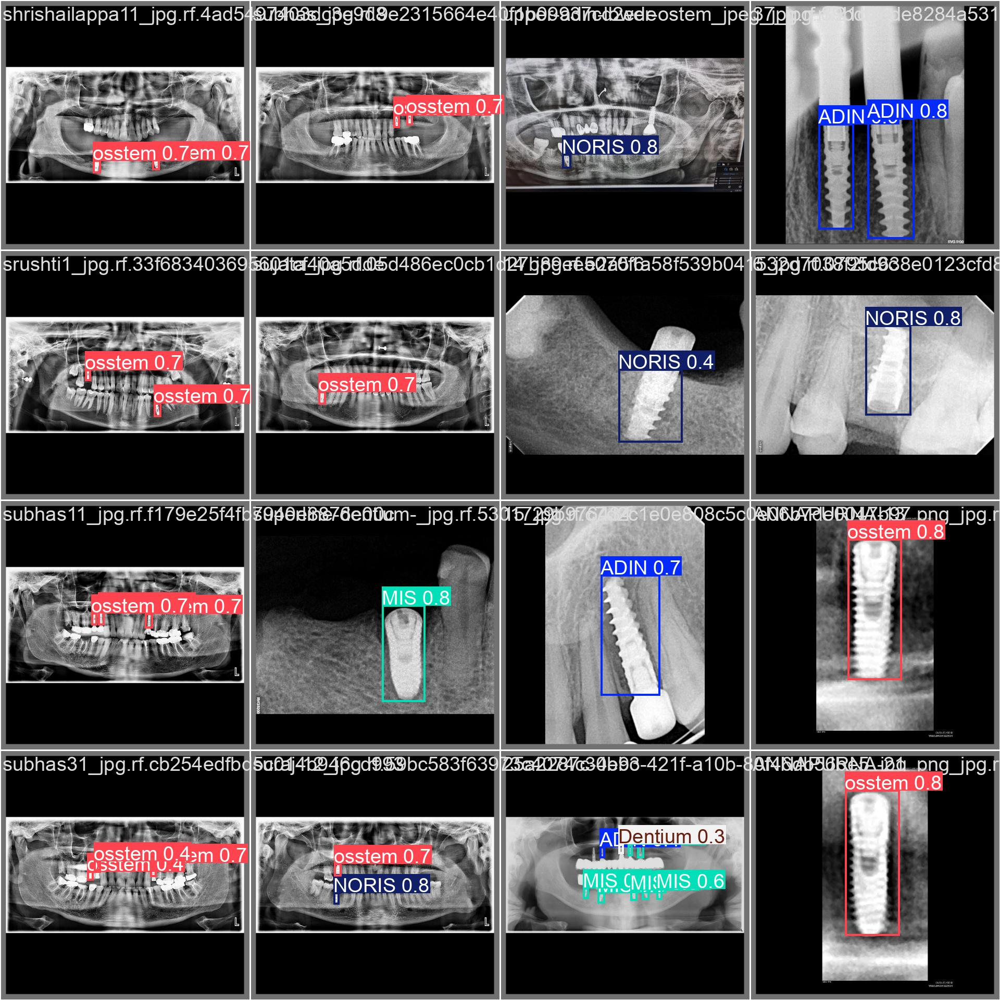


val_batch0_labels.jpg:


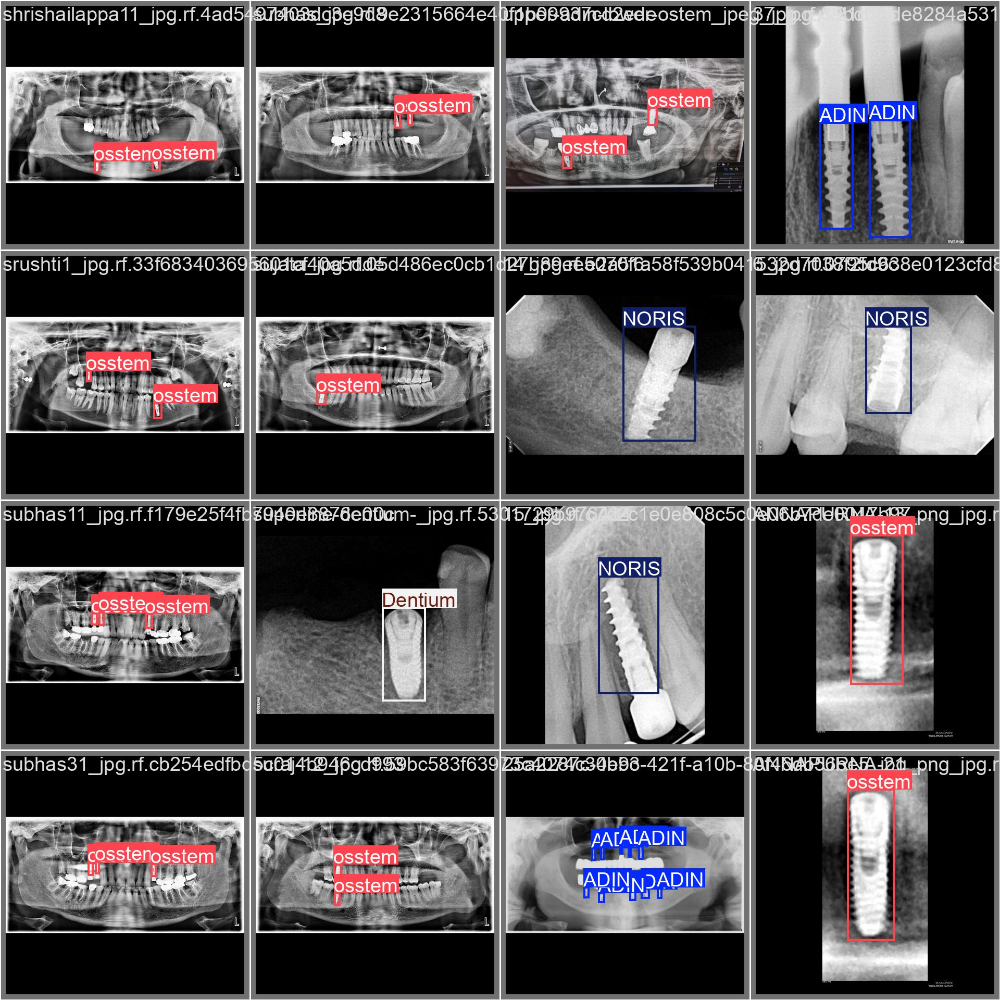


val_batch1_pred.jpg:


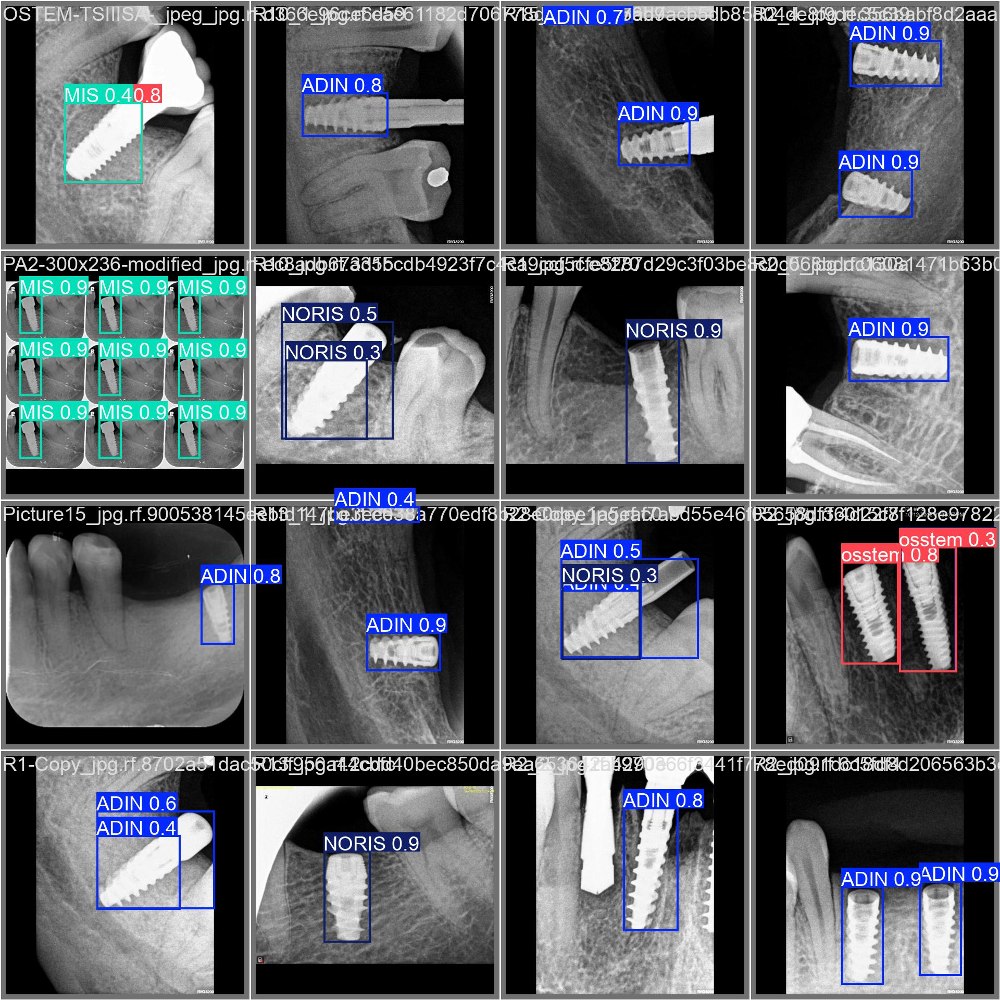


val_batch1_labels.jpg:


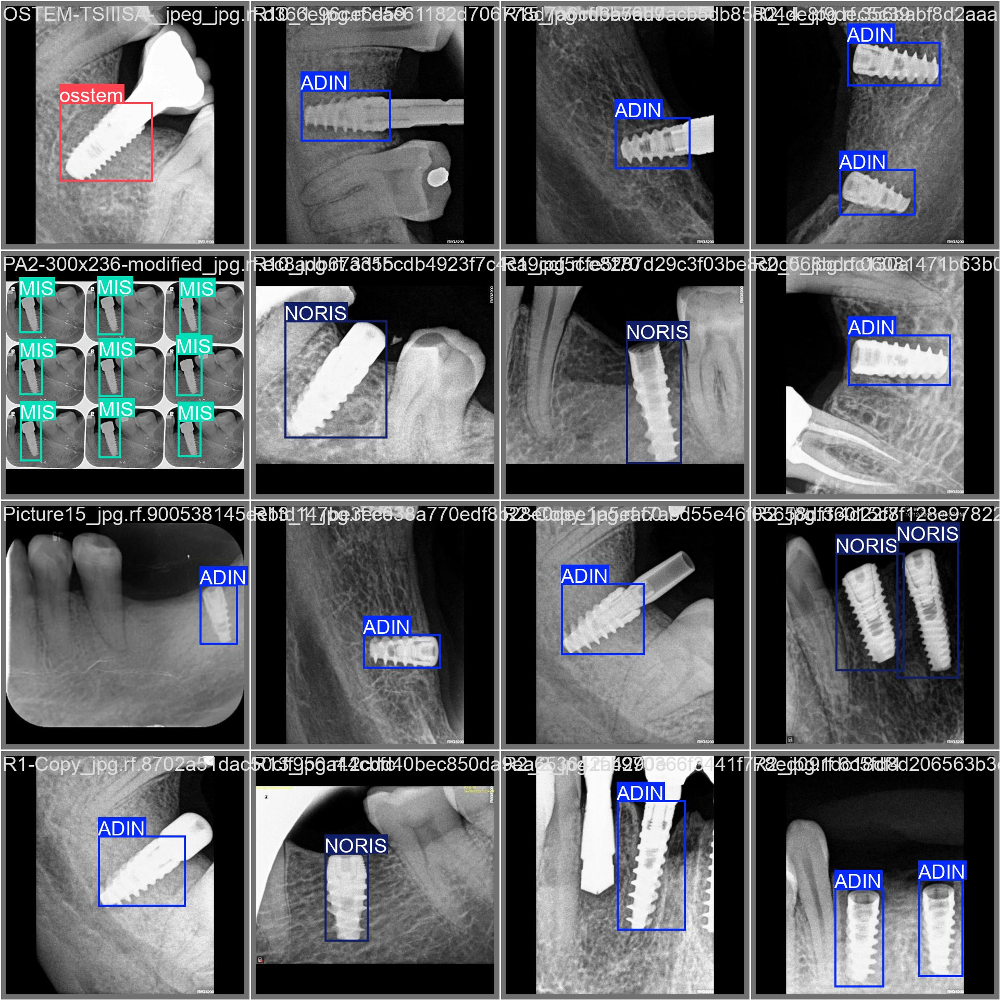


val_batch2_pred.jpg:


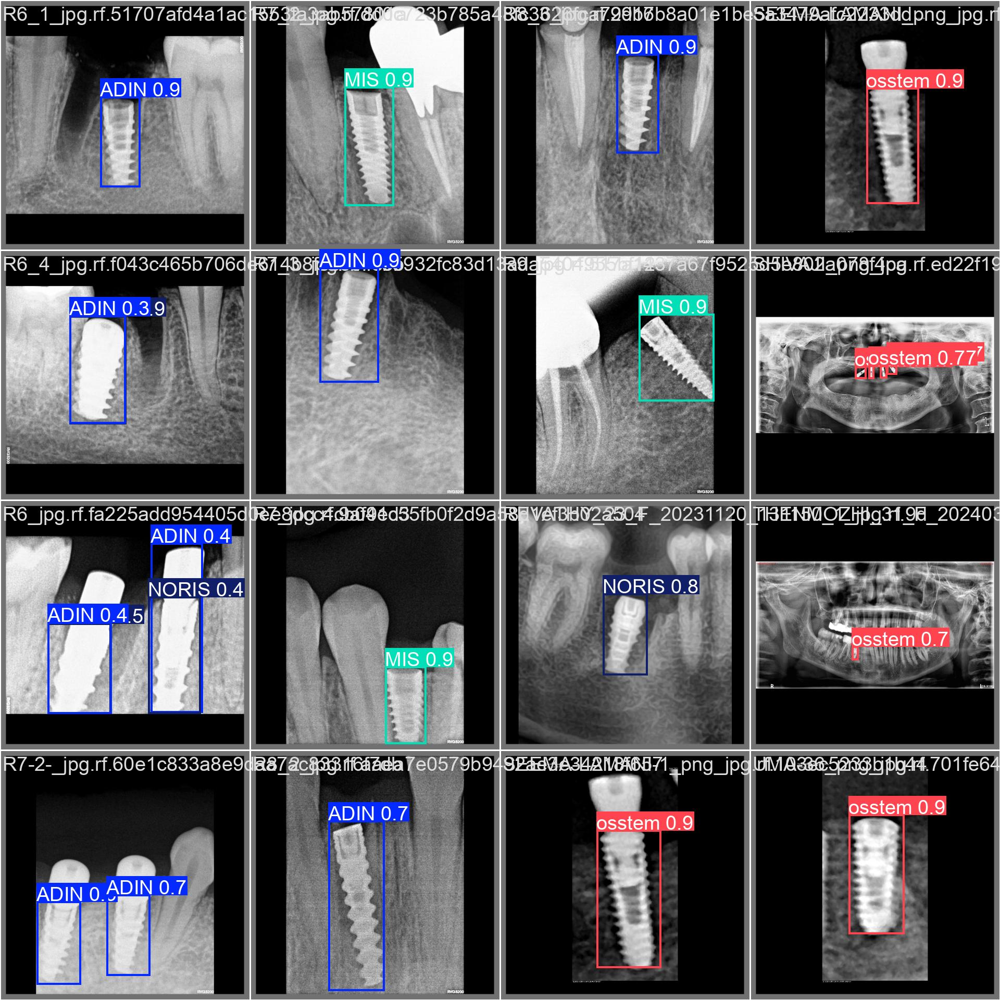


val_batch2_labels.jpg:


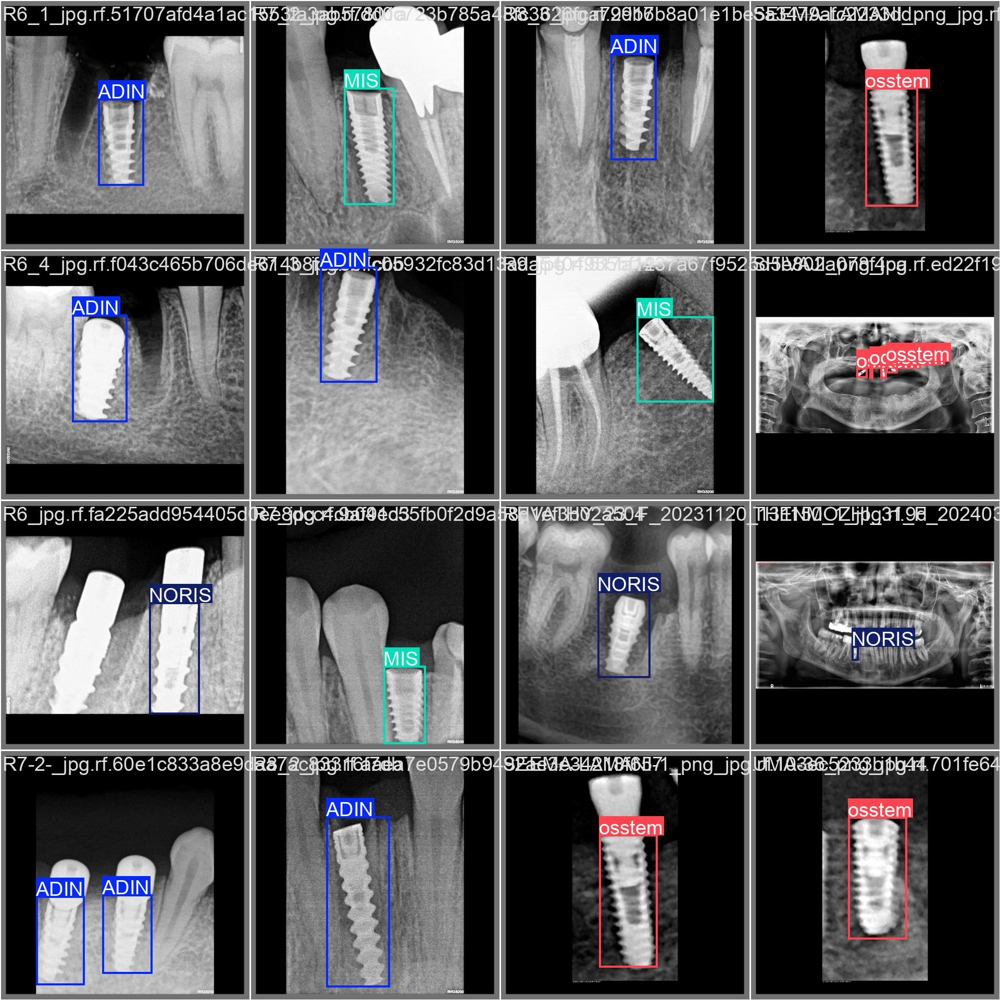


Training Batches

train_batch0.jpg:


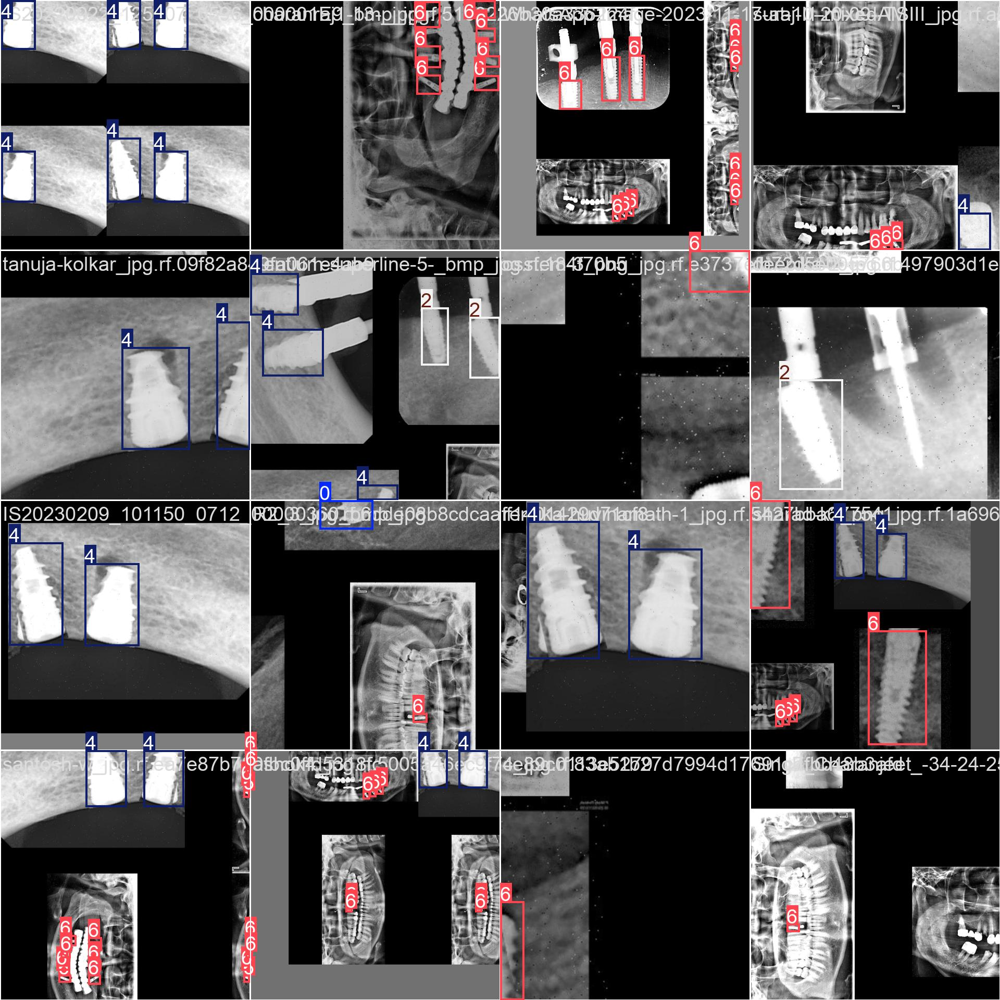


train_batch1.jpg:


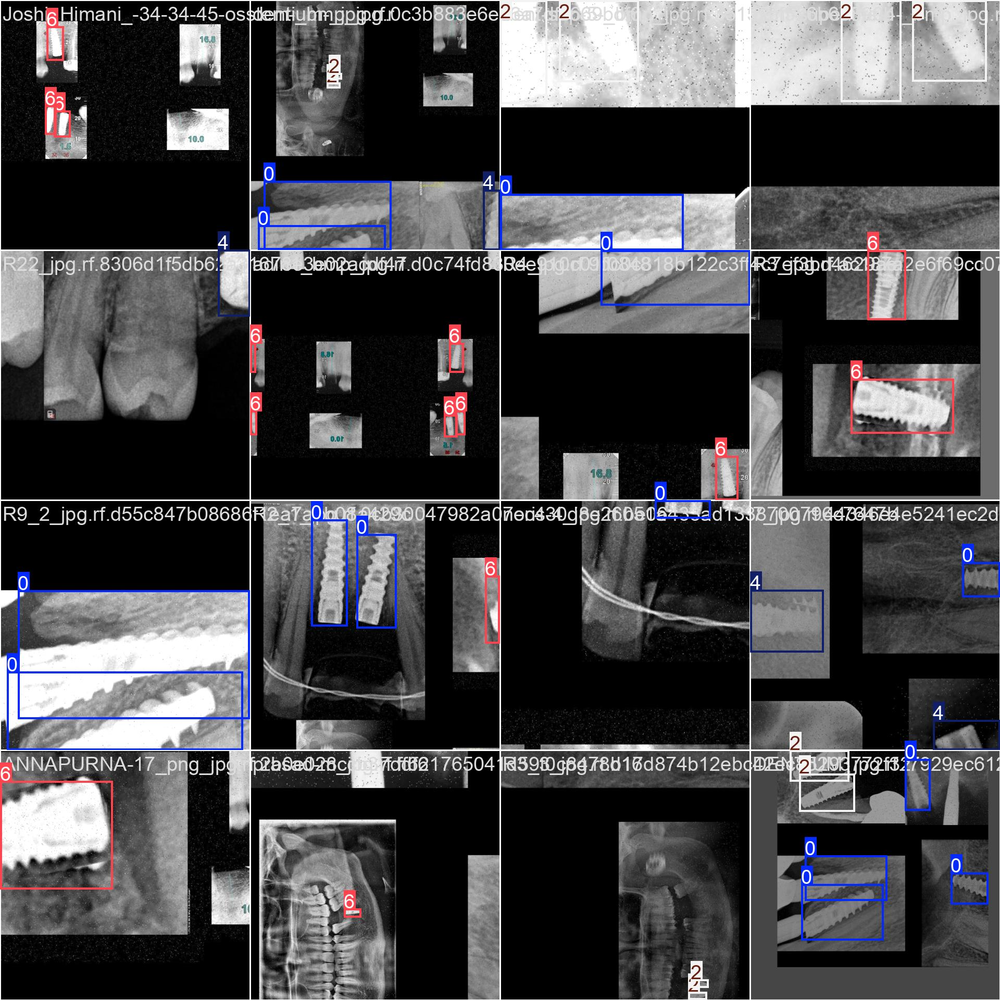


train_batch2.jpg:


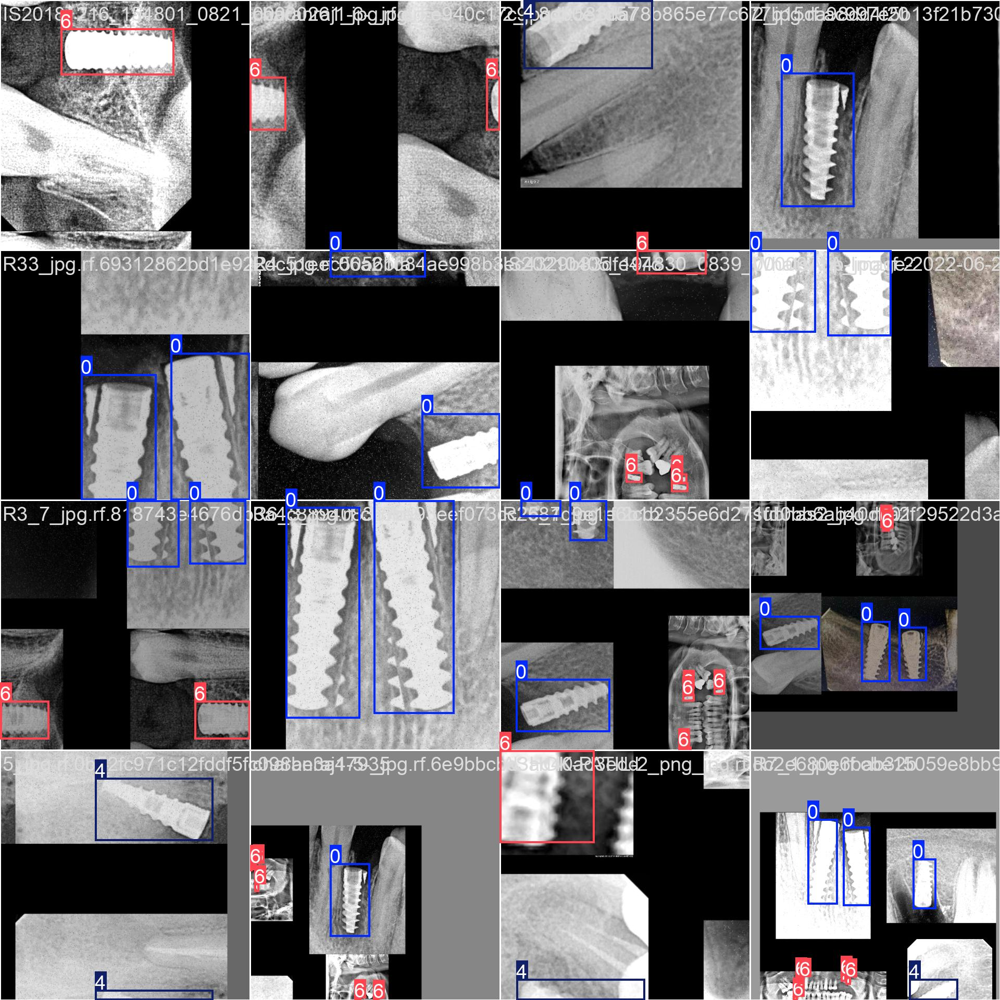


Performance Curves

PR_curve.png:


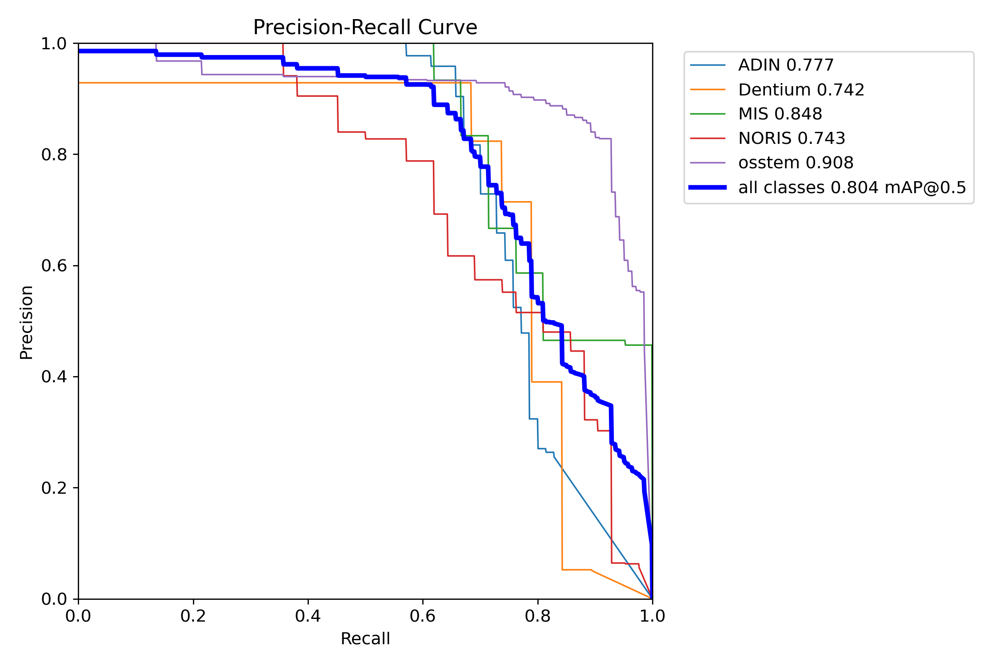


R_curve.png:


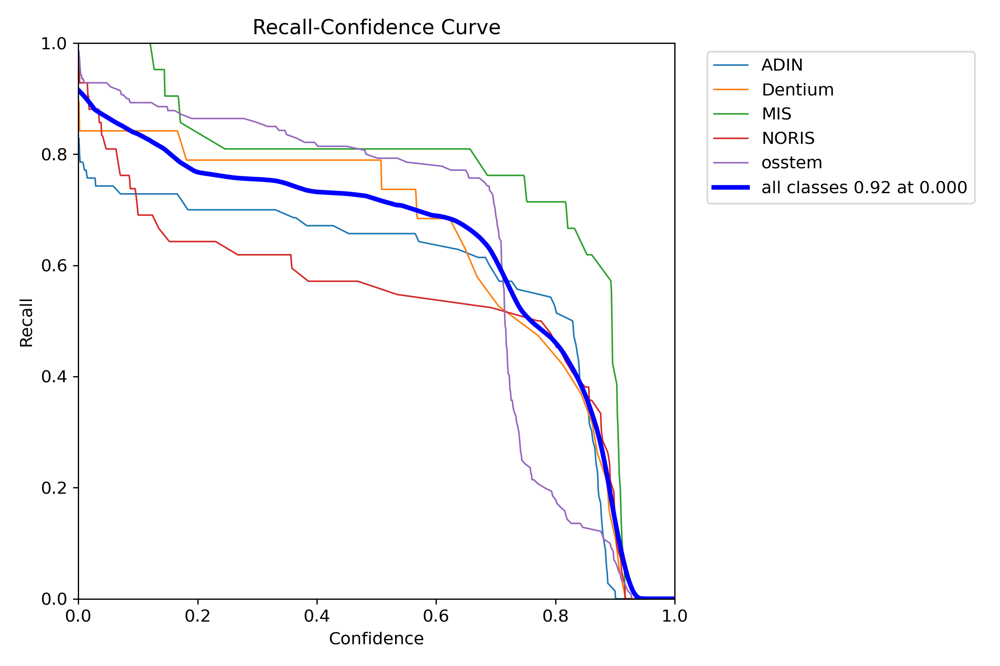


F1_curve.png:


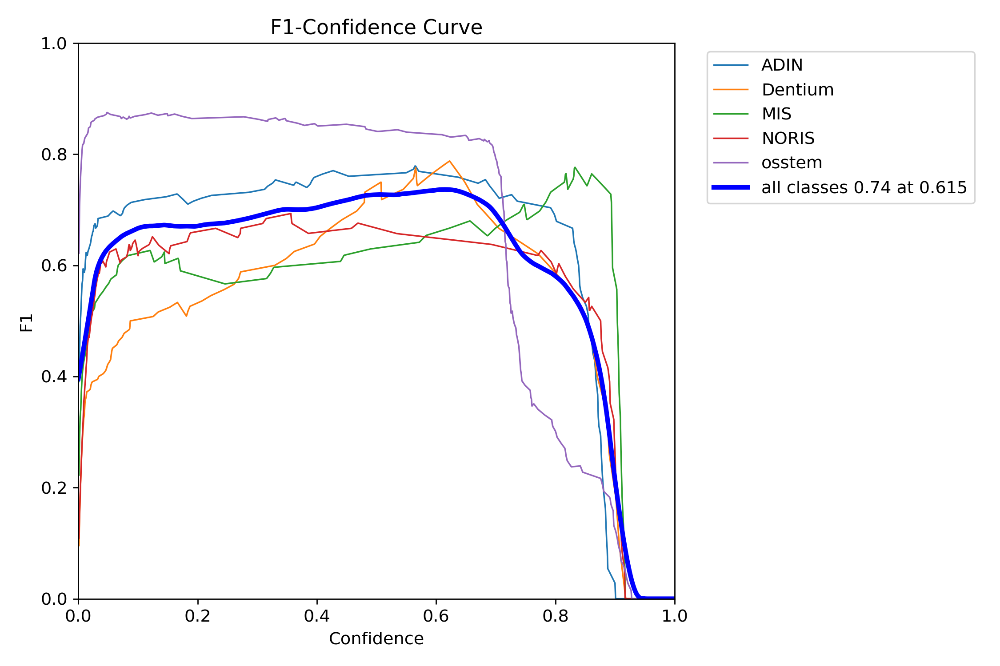


P_curve.png:


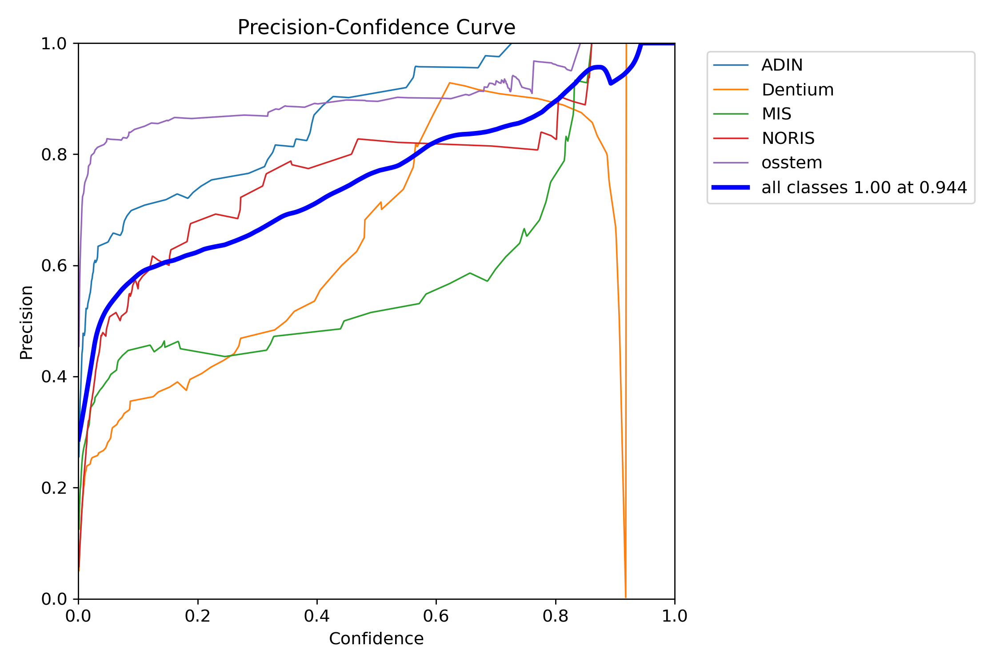


results.png:


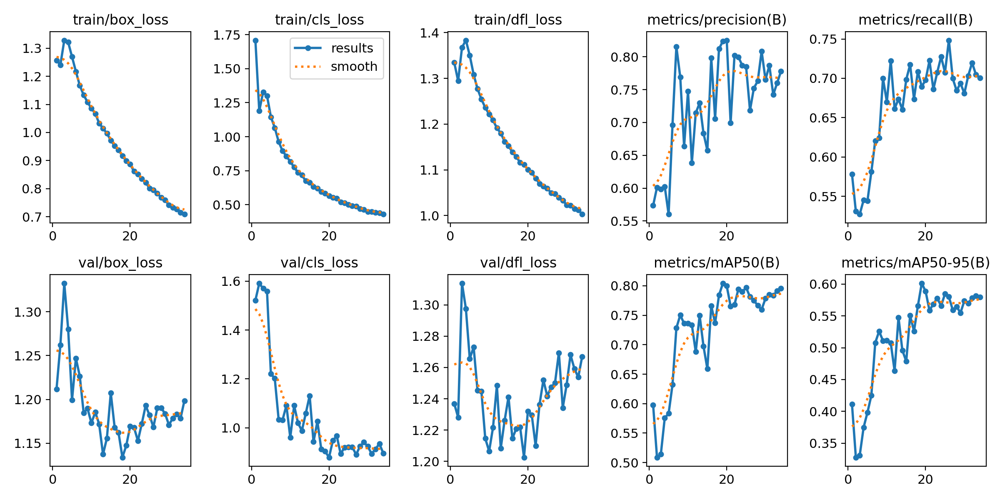


Label Analysis

labels_correlogram.jpg:


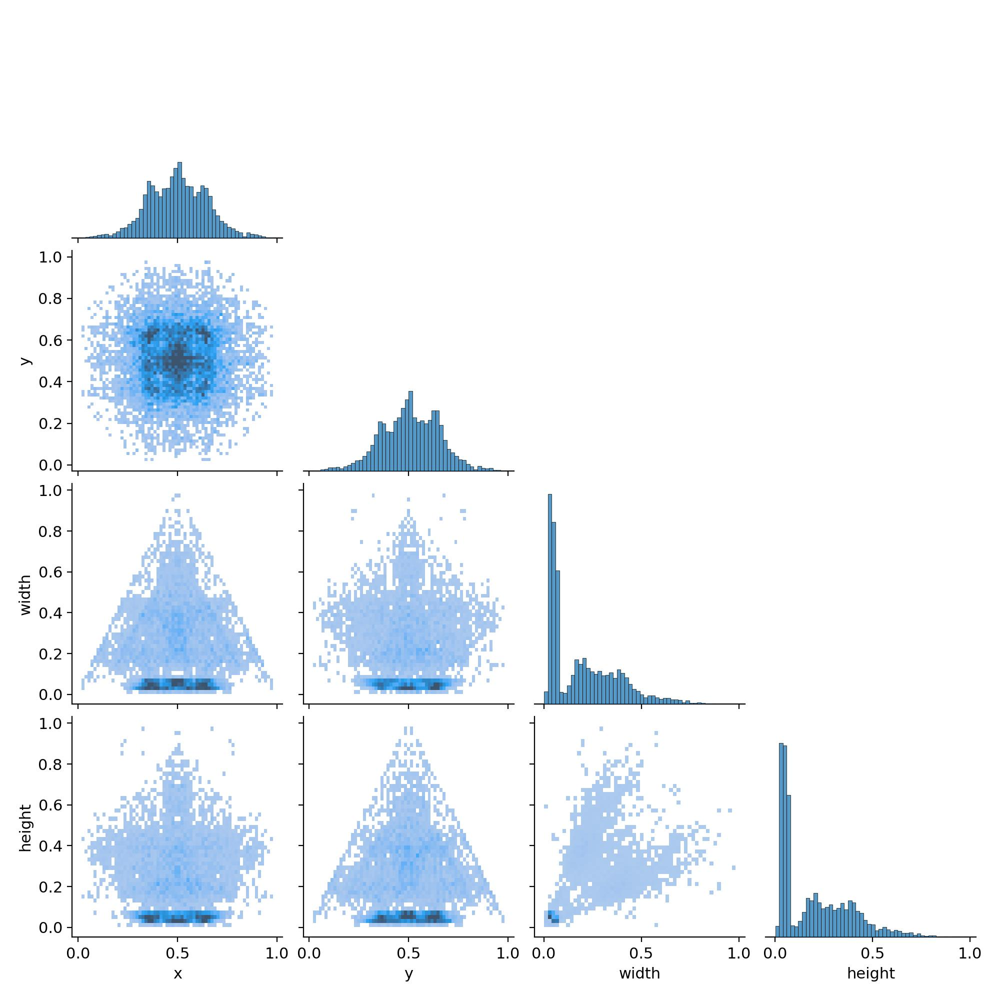


labels.jpg:


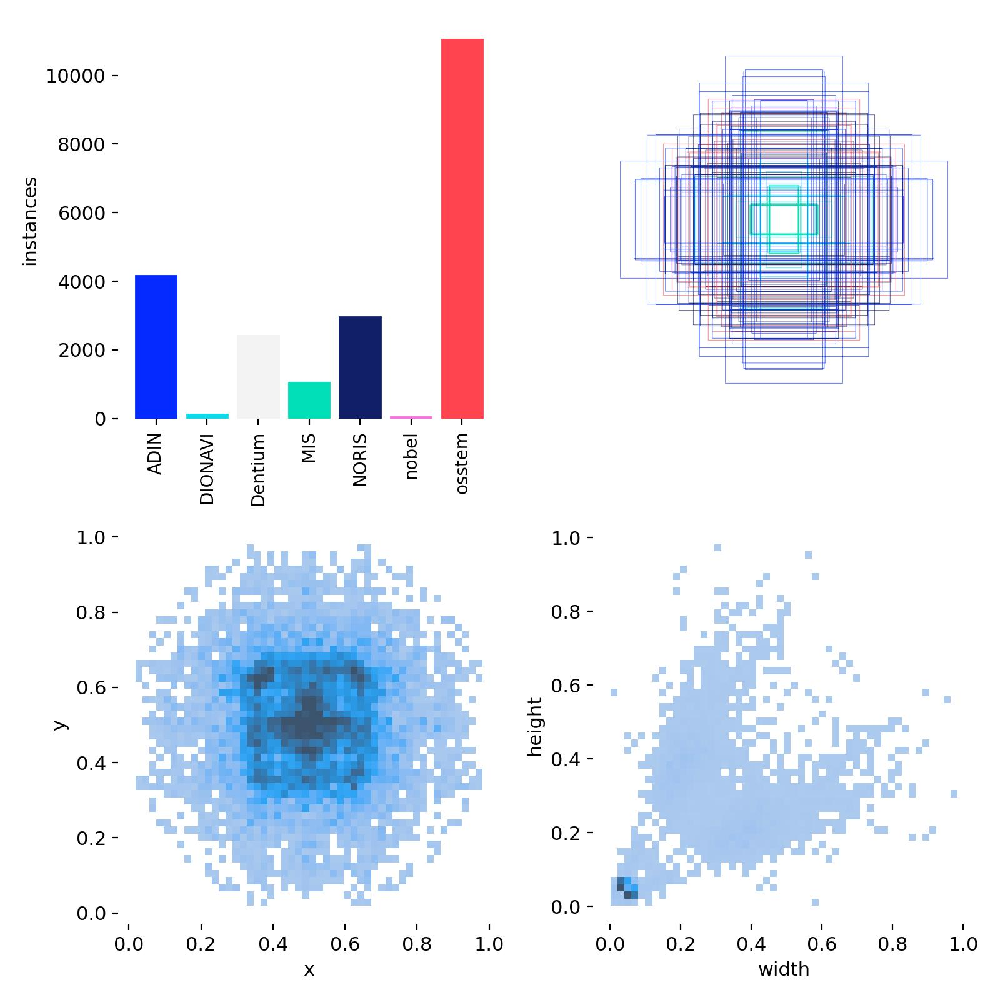


confusion_matrix.png:


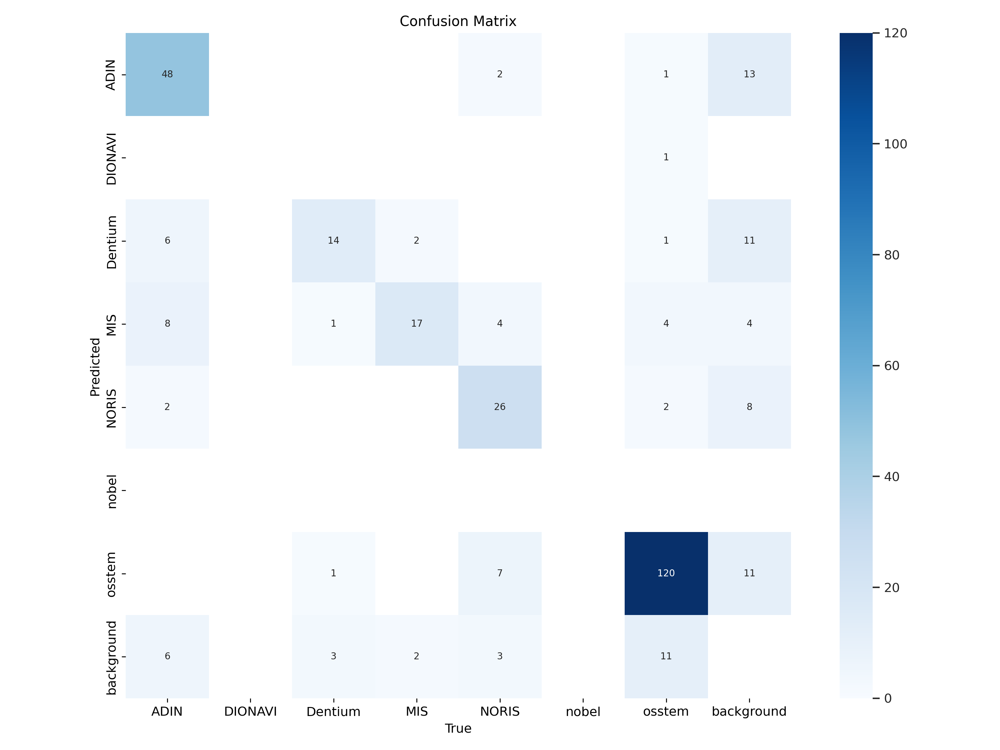


confusion_matrix_normalized.png:


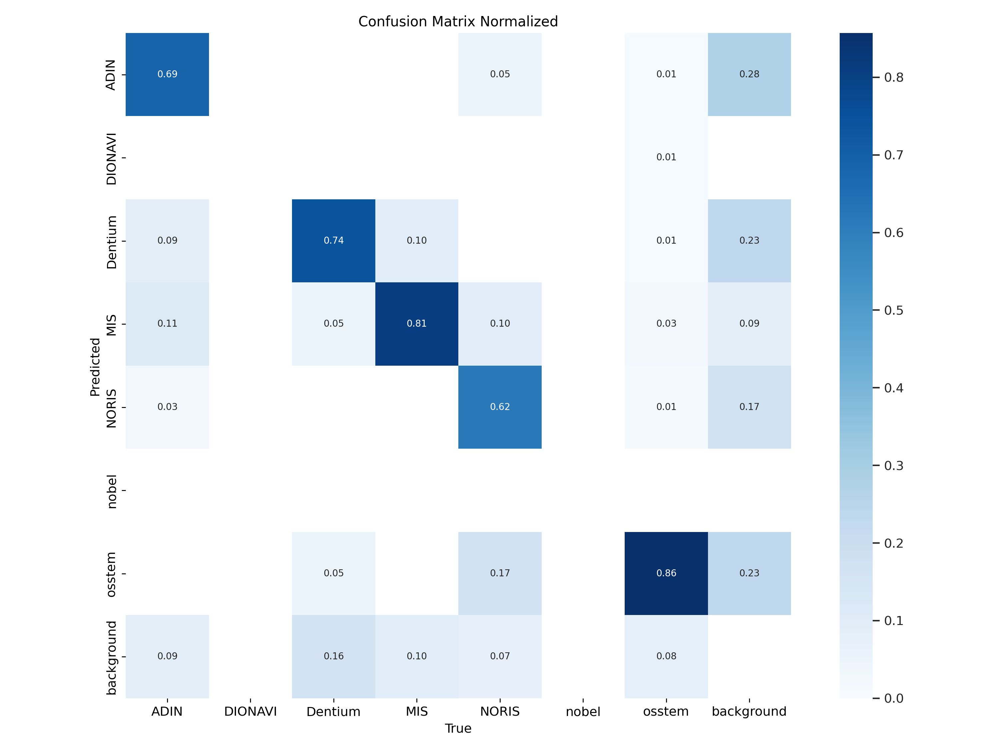


{'='*50}
Results CSV Content:
epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
1,266.774,1.25669,1.7096,1.33474,0.57347,0.57821,0.59781,0.4111,1.21184,1.5219,1.2369,0.00332908,0.00332908,0.00332908
2,508.16,1.24098,1.18954,1.29427,0.60121,0.53075,0.50881,0.32775,1.26219,1.59127,1.22812,0.00659646,0.00659646,0.00659646
3,743.945,1.32856,1.32891,1.36768,0.59829,0.52715,0.51451,0.33097,1.33231,1.57006,1.31379,0.00979783,0.00979783,0.00979783
4,977.471,1.32165,1.30136,1.38343,0.60237,0.54515,0.57575,0.37479,1.28022,1.55864,1.29767,0.009703,0.009703,0.009703
5,1211.12,1.26955,1.14549,1.35016,0.56029,0.54441,0.58324,0.39847,1.19936,1.22055,1.2656,0.009604,0.009604,0.009604
6,1444.67,1.21705,1.0658,1.30853,0.69643,0.58109,0.63201,0.42511,1.24682,1.20228,1.27312,0.009505,0.009505,0.009505
7,1678.45,1.16758,0.96301,1.27719,0.8154,0.62056,0.72824,0.50778

In [ ]:
from IPython.display import Image, display, HTML
import glob
import os

HOME = '/content'
train_dir = f'{HOME}/runs/detect/train'

def display_images_with_titles():
    # Define groups of related images
    image_groups = {
        'Validation Predictions & Labels': [
            'val_batch0_pred.jpg', 'val_batch0_labels.jpg',
            'val_batch1_pred.jpg', 'val_batch1_labels.jpg',
            'val_batch2_pred.jpg', 'val_batch2_labels.jpg'
        ],
        'Training Batches': [
            'train_batch0.jpg',
            'train_batch1.jpg',
            'train_batch2.jpg'
        ],
        'Performance Curves': [
            'PR_curve.png',
            'R_curve.png',
            'F1_curve.png',
            'P_curve.png',
            'results.png'
        ],
        'Label Analysis': [
            'labels_correlogram.jpg',
            'labels.jpg',
            'confusion_matrix.png',
            'confusion_matrix_normalized.png'
        ]
    }

    for group_name, images in image_groups.items():
        print(f"\n{'='*50}")
        print(f"{group_name}")
        print('='*50)

        for img_name in images:
            img_path = os.path.join(train_dir, img_name)
            if os.path.exists(img_path):
                print(f"\n{img_name}:")
                display(Image(filename=img_path, width=800))
            else:
                print(f"\nFile not found: {img_name}")

# Display all images
display_images_with_titles()

# Display results.csv content if it exists
results_path = os.path.join(train_dir, 'results.csv')
if os.path.exists(results_path):
    print("\n{'='*50}")
    print("Results CSV Content:")
    print('='*50)
    with open(results_path, 'r') as f:
        print(f.read())

In [ ]:
import pandas as pd

# Read the results.csv
results_df = pd.read_csv(f'{HOME}/runs/detect/train/results.csv')

# Display the DataFrame
display(results_df)

# Optional: Get basic statistics
print("\nDataFrame Statistics:")
display(results_df.describe())

# Optional: Get column names
print("\nAvailable Metrics:", results_df.columns.tolist())

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,266.774,1.25669,1.70960,1.33474,0.57347,0.57821,0.59781,0.41110,1.21184,1.52190,1.23690,0.003329,0.003329,0.003329
1,2,508.160,1.24098,1.18954,1.29427,0.60121,0.53075,0.50881,0.32775,1.26219,1.59127,1.22812,0.006596,0.006596,0.006596
2,3,743.945,1.32856,1.32891,1.36768,0.59829,0.52715,0.51451,0.33097,1.33231,1.57006,1.31379,0.009798,0.009798,0.009798
3,4,977.471,1.32165,1.30136,1.38343,0.60237,0.54515,0.57575,0.37479,1.28022,1.55864,1.29767,0.009703,0.009703,0.009703
4,5,1211.120,1.26955,1.14549,1.35016,0.56029,0.54441,0.58324,0.39847,1.19936,1.22055,1.26560,0.009604,0.009604,0.009604
5,6,1444.670,1.21705,1.06580,1.30853,0.69643,0.58109,0.63201,0.42511,1.24682,1.20228,1.27312,0.009505,0.009505,0.009505
6,7,1678.450,1.16758,0.96301,1.27719,0.81540,0.62056,0.72824,0.50778,1.22662,1.03432,1.24543,0.009406,0.009406,0.009406
7,8,1912.320,1.13347,0.89622,1.25471,0.76920,0.62404,0.75034,0.52584,1.18471,1.03164,1.24491,0.009307,0.009307,0.009307
8,9,2146.110,1.10809,0.85614,1.23599,0.66363,0.69990,0.73596,0.51108,1.18969,1.09160,1.21471,0.009208,0.009208,0.009208
9,10,2379.650,1.08546,0.81671,1.22169,0.74739,0.67003,0.73609,0.51168,1.17312,0.96023,1.20644,0.009109,0.009109,0.009109



DataFrame Statistics:


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
count,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000
mean,17.500000,4130.287941,0.962077,0.723163,1.150945,0.728373,0.667963,0.726850,0.519051,1.189877,1.047746,1.242129,0.008073,0.008073,0.008073
std,9.958246,2326.244967,0.193175,0.312576,0.115604,0.077253,0.061352,0.083299,0.075568,0.040376,0.209136,0.025300,0.001263,0.001263,0.001263
min,1.000000,266.774000,0.708870,0.429540,1.002800,0.560290,0.527150,0.508810,0.327750,1.133940,0.879020,1.202540,0.003329,0.003329,0.003329
25%,9.250000,2204.495000,0.797350,0.493878,1.051875,0.686890,0.660570,0.705163,0.498883,1.168600,0.919810,1.222927,0.007352,0.007352,0.007352
50%,17.500000,4130.555000,0.927230,0.608875,1.122280,0.749850,0.691600,0.762590,0.552680,1.182655,0.954125,1.241450,0.008168,0.008168,0.008168
75%,25.750000,6057.490000,1.102432,0.846283,1.232415,0.786867,0.706705,0.783948,0.572755,1.197150,1.083045,1.253322,0.008985,0.008985,0.008985
max,34.000000,7983.400000,1.328560,1.709600,1.383430,0.825240,0.748420,0.804160,0.601160,1.332310,1.591270,1.313790,0.009798,0.009798,0.009798



Available Metrics: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']
